U-Net Base model

Mounted at /content/drive
Found 1160 images.
Found 1160 mask files.
Epoch 1/75
87/87 [==============================] - 699s 8s/step - loss: 0.2149 - accuracy: 0.9694 - val_loss: 0.0824 - val_accuracy: 0.9770
Epoch 2/75
87/87 [==============================] - 39s 450ms/step - loss: 0.0936 - accuracy: 0.9775 - val_loss: 0.0800 - val_accuracy: 0.9770
Epoch 3/75
87/87 [==============================] - 39s 452ms/step - loss: 0.0818 - accuracy: 0.9775 - val_loss: 0.0768 - val_accuracy: 0.9770
Epoch 4/75
87/87 [==============================] - 39s 446ms/step - loss: 0.0758 - accuracy: 0.9775 - val_loss: 0.0732 - val_accuracy: 0.9770
Epoch 5/75
87/87 [==============================] - 39s 449ms/step - loss: 0.0716 - accuracy: 0.9771 - val_loss: 0.0924 - val_accuracy: 0.9770
Epoch 6/75
87/87 [==============================] - 39s 447ms/step - loss: 0.0780 - accuracy: 0.9775 - val_loss: 0.0730 - val_accuracy: 0.9770
Epoch 7/75
87/87 [==============================] - 39s 446ms/step - loss: 0

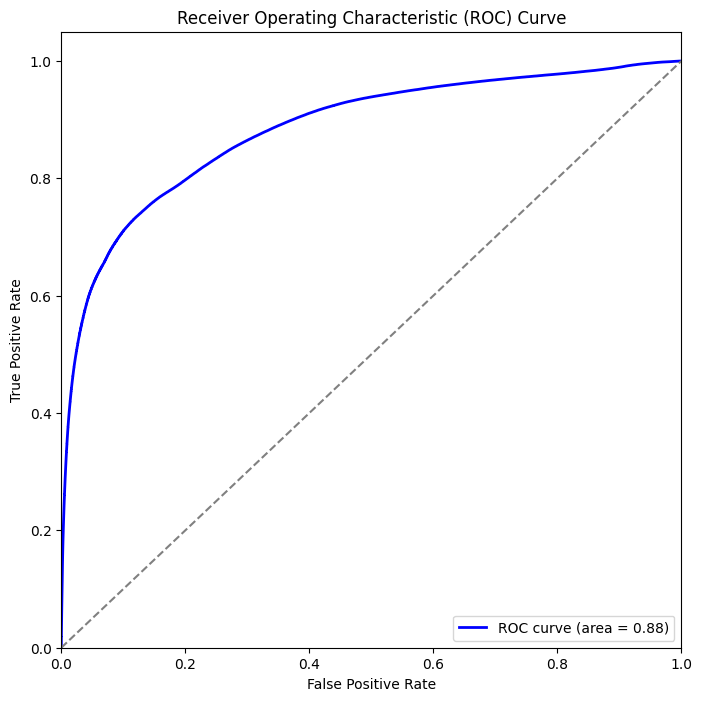

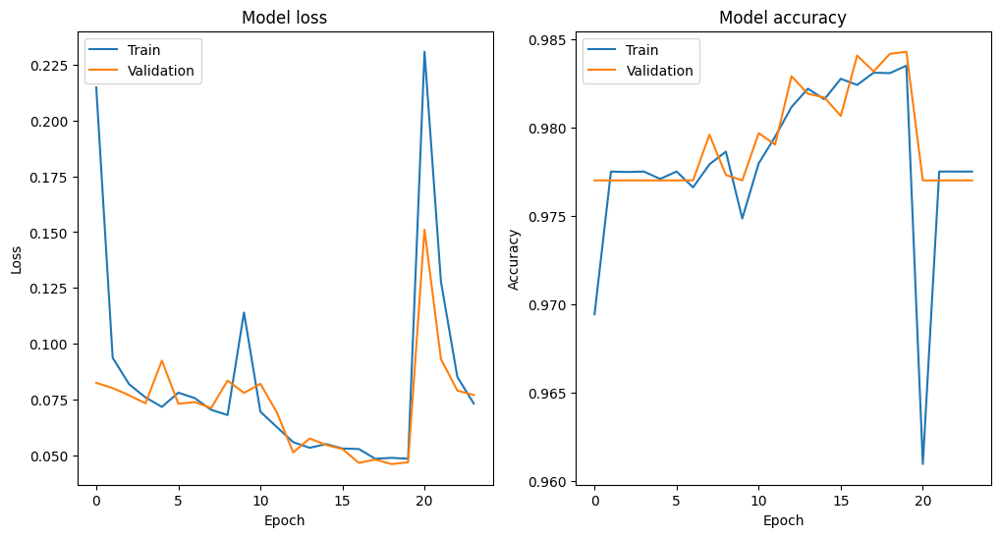

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import xml.etree.ElementTree as ET

from google.colab import drive
drive.mount('/content/drive')

images_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/JPEGImages'
masks_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/Annotations'

if not os.path.exists(images_path):
    raise ValueError(f"Images directory '{images_path}' not found.")

if not os.path.exists(masks_path):
    raise ValueError(f"Masks directory '{masks_path}' not found.")

images = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith('.jpg')])
mask_files = sorted([os.path.join(masks_path, f) for f in os.listdir(masks_path) if f.endswith('.xml')])

if len(mask_files) == 0:
    raise ValueError("No mask files found in the specified directory. Please check your mask directory.")

print(f"Found {len(images)} images.")
print(f"Found {len(mask_files)} mask files.")

train_images, test_images, train_masks, test_masks = train_test_split(images, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(test_images, test_masks, test_size=0.5, random_state=42)

def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return (img, mask)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, images_paths, masks_paths, batch_size=8, image_size=(256, 256)):
        self.images_paths = images_paths
        self.masks_paths = masks_paths
        self.batch_size = batch_size
        self.image_size = image_size

    def __len__(self):
        return len(self.images_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.images_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.masks_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        x = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)
        y = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_x, batch_y)):
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            mask = np.zeros_like(img, dtype=np.uint8)

            tree = ET.parse(mask_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                cv2.rectangle(mask, (xmin, ymin), (xmax, ymax), (255), thickness=-1)

            img = cv2.resize(img, self.image_size)
            mask = cv2.resize(mask, self.image_size)

            img = np.expand_dims(img, axis=-1)
            mask = np.expand_dims(mask, axis=-1)

            x[i], y[i] = adjust_data(img, mask)

        return x, y

def unet_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    up6 = Conv2DTranspose(512, 2, strides=(2, 2), padding='same')(conv5)
    up6 = concatenate([up6, conv4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv7)
    up8 = concatenate([up8, conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv8)
    up9 = concatenate([up9, conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model = unet_model(input_size=(256, 256, 1))

batch_size = 8
train_gen = DataGenerator(train_images, train_masks, batch_size=batch_size)
val_gen = DataGenerator(val_images, val_masks, batch_size=batch_size)

history = model.fit(train_gen,
                    epochs=75,
                    validation_data=val_gen,
                    callbacks=[early_stopping])

test_gen = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_pred = model.predict(test_gen)

y_true_flat = np.concatenate([test_gen[i][1].flatten() for i in range(len(test_gen))])
y_pred_flat = y_pred.flatten()

y_pred_binary = (y_pred_flat > 0.5).astype(int)

fpr, tpr, thresholds = roc_curve(y_true_flat, y_pred_flat)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [2]:
from sklearn.metrics import f1_score, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score
import math

def compute_iou_masks(y_true, y_pred):
    intersection_area = 0
    union_area = 0

    for mask_true, mask_pred in zip(y_true, y_pred):
        intersection = np.logical_and(mask_true, mask_pred)
        union = np.logical_or(mask_true, mask_pred)

        intersection_area += np.sum(intersection)
        union_area += np.sum(union)

    if union_area == 0:
        return 0

    return intersection_area / union_area

def compute_map_boxes(y_true, y_pred):
    avg_precision = 0

    for i in range(len(y_true)):
        y_true_flat = y_true[i].flatten()
        y_pred_flat = y_pred[i].flatten()

        precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

        avg_precision += average_precision_score(y_true_flat, y_pred_flat)

    return avg_precision / len(y_true)


def compute_psnr_boxes(y_true, y_pred):
    mse_total = 0
    num_samples = len(y_true)

    for box_true, box_pred in zip(y_true, y_pred):
        mse = np.mean((box_true - box_pred) ** 2)
        mse_total += mse

    mse_avg = mse_total / num_samples

    if mse_avg == 0:
        return float('inf')
    else:
        max_pixel = 1.0
        return 20 * math.log10(max_pixel / math.sqrt(mse_avg))

def compute_dice_boxes(y_true, y_pred):
    dice_scores = []

    for box_true, box_pred in zip(y_true, y_pred):
        intersection = np.sum(box_true * box_pred)
        dice = (2. * intersection) / (np.sum(box_true) + np.sum(box_pred))
        dice_scores.append(dice)

    return np.mean(dice_scores)

y_pred = model.predict(test_gen)

test_gen_no_shuffle = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_true = []
for i in range(len(test_gen_no_shuffle)):
    _, batch_y = test_gen_no_shuffle[i]
    y_true.extend(batch_y)

y_true = np.array(y_true)

if y_pred.shape != y_true.shape:
    raise ValueError("Shapes of y_pred and y_true are not compatible.")


iou_boxes = compute_iou_masks(y_true, y_pred)
mAP_boxes = compute_map_boxes(y_true, y_pred)
psnr_boxes = compute_psnr_boxes(y_true, y_pred)
dice_boxes = compute_dice_boxes(y_true, y_pred)

print("Intersection over Union (IoU) for Segmentation Boxes:", iou_boxes)
print("Mean Average Precision (mAP) for Segmentation Boxes:", mAP_boxes)
print("Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes:", psnr_boxes)
print("Dice Coefficient for Segmentation Boxes:", dice_boxes)

29/29 [==============================] - 4s 133ms/step
Intersection over Union (IoU) for Segmentation Boxes: 0.02524810001767915
Mean Average Precision (mAP) for Segmentation Boxes: 0.6584484407793769
Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes: 17.00527149532041
Dice Coefficient for Segmentation Boxes: 0.20754696589959215


29/29 [==============================] - 4s 127ms/step


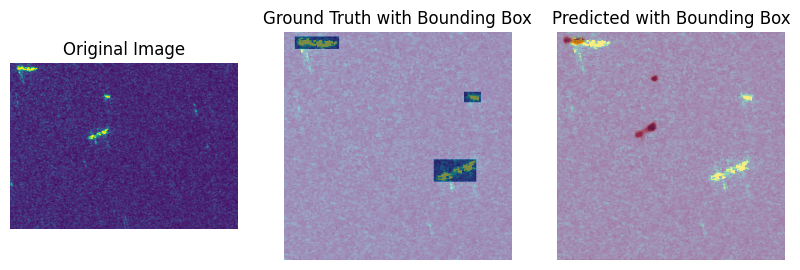

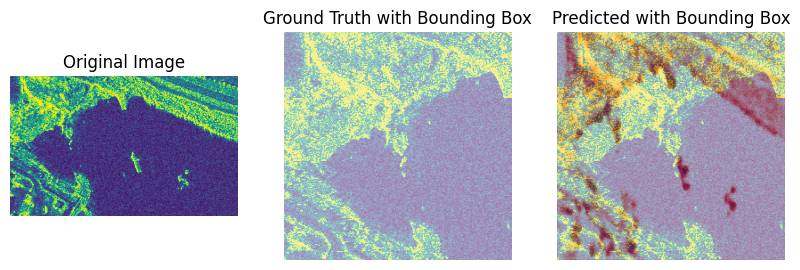

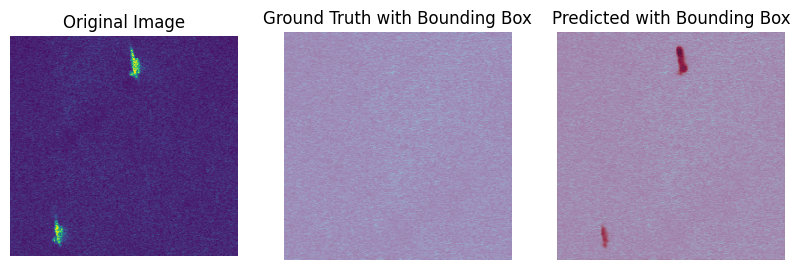

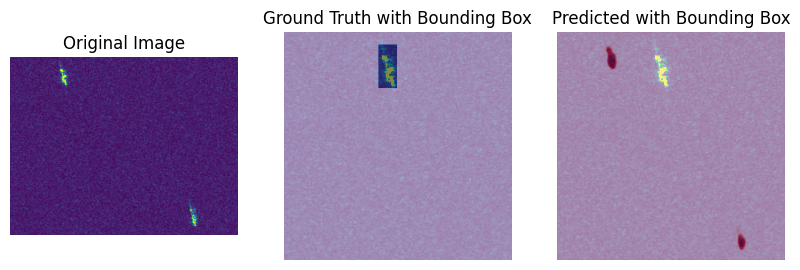

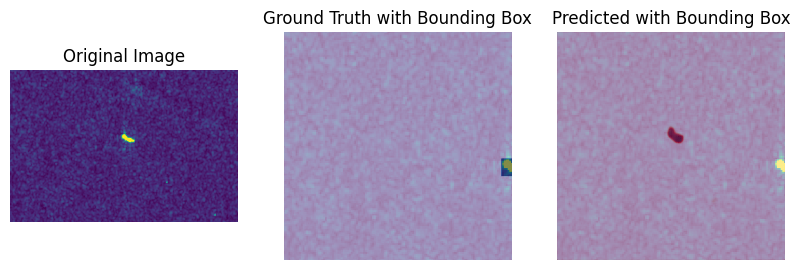

In [5]:
import matplotlib.pyplot as plt

def create_segmentation_masks(xml_path, image_size):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    mask = np.zeros(image_size, dtype=np.uint8)

    for obj in root.findall('object'):
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        mask[ymin:ymax, xmin:xmax] = 1

    return mask

def visualize_bounding_boxes(images, masks, predictions):
    num_images = len(images)

    for i in range(num_images):
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        mask = create_segmentation_masks(mask, (256, 256))
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap='Blues')
        plt.title("Ground Truth with Bounding Box")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap='Reds')
        plt.title("Predicted with Bounding Box")
        plt.axis('off')

        plt.show()

y_pred = model.predict(test_gen)
visualize_bounding_boxes(test_images[:5], test_masks[:5], y_pred[:5])

ShiftNet

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 1160 images.
Found 1160 mask files.
Epoch 1/75
87/87 [==============================] - 44s 368ms/step - loss: 0.1508 - accuracy: 0.9668 - val_loss: 0.0720 - val_accuracy: 0.9770
Epoch 2/75
87/87 [==============================] - 31s 357ms/step - loss: 0.0679 - accuracy: 0.9775 - val_loss: 0.0667 - val_accuracy: 0.9770
Epoch 3/75
87/87 [==============================] - 33s 377ms/step - loss: 0.0597 - accuracy: 0.9778 - val_loss: 0.0587 - val_accuracy: 0.9802
Epoch 4/75
87/87 [==============================] - 31s 360ms/step - loss: 0.0609 - accuracy: 0.9778 - val_loss: 0.0550 - val_accuracy: 0.9781
Epoch 5/75
87/87 [==============================] - 31s 355ms/step - loss: 0.0583 - accuracy: 0.9802 - val_loss: 0.0497 - val_accuracy: 0.9829
Epoch 6/75
87/87 [==============================] - 31s 360ms/step - loss: 0.0450 - accuracy: 0.9838 - val_loss: 0

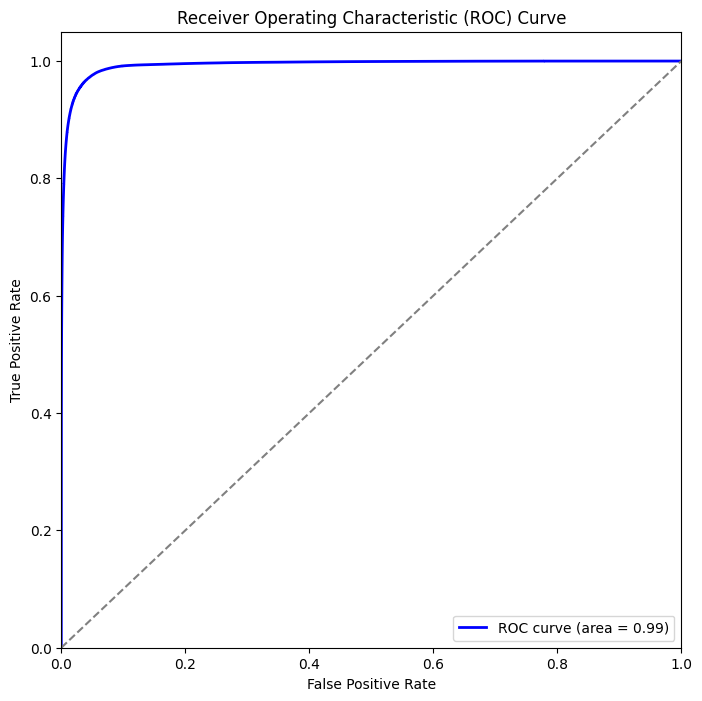

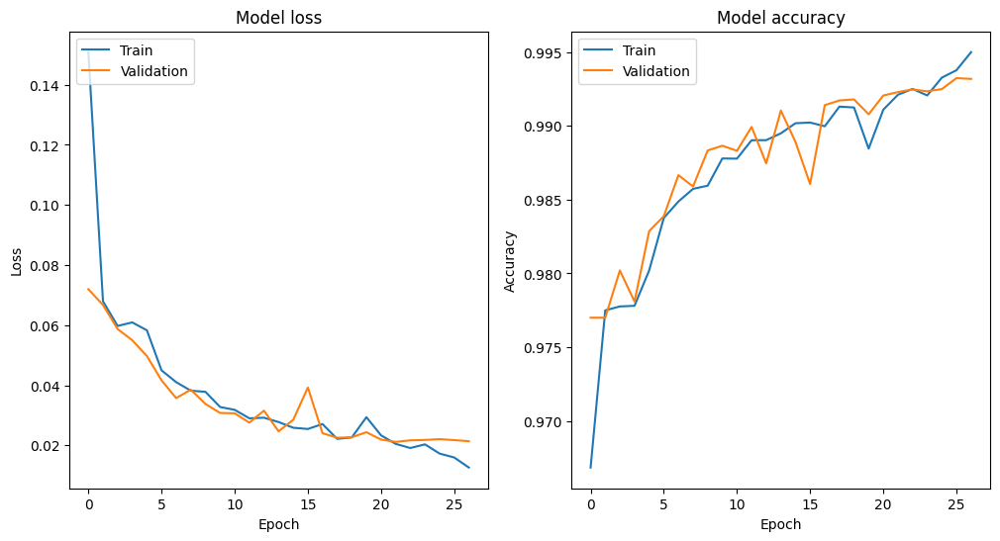

In [26]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, f1_score, roc_curve, auc
from skimage.metrics import peak_signal_noise_ratio
from tensorflow.keras.callbacks import EarlyStopping
import xml.etree.ElementTree as ET

from google.colab import drive
drive.mount('/content/drive')

images_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/JPEGImages'
masks_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/Annotations'

if not os.path.exists(images_path):
    raise ValueError(f"Images directory '{images_path}' not found.")

if not os.path.exists(masks_path):
    raise ValueError(f"Masks directory '{masks_path}' not found.")

images = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith('.jpg')])
mask_files = sorted([os.path.join(masks_path, f) for f in os.listdir(masks_path) if f.endswith('.xml')])

if len(mask_files) == 0:
    raise ValueError("No mask files found in the specified directory. Please check your mask directory.")

print(f"Found {len(images)} images.")
print(f"Found {len(mask_files)} mask files.")

train_images, test_images, train_masks, test_masks = train_test_split(images, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(test_images, test_masks, test_size=0.5, random_state=42)

def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return (img, mask)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, images_paths, masks_paths, batch_size=8, image_size=(256, 256)):
        self.images_paths = images_paths
        self.masks_paths = masks_paths
        self.batch_size = batch_size
        self.image_size = image_size

    def __len__(self):
        return len(self.images_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.images_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.masks_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        x = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)
        y = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_x, batch_y)):
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            mask = np.zeros_like(img, dtype=np.uint8)

            tree = ET.parse(mask_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                cv2.rectangle(mask, (xmin, ymin), (xmax, ymax), (255), thickness=-1)

            img = cv2.resize(img, self.image_size)
            mask = cv2.resize(mask, self.image_size)

            img = np.expand_dims(img, axis=-1)
            mask = np.expand_dims(mask, axis=-1)

            x[i], y[i] = adjust_data(img, mask)

        return x, y

def swiftnet_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv2 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    maxpool1 = MaxPooling2D()(conv2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same')(maxpool1)
    conv4 = Conv2D(128, 3, activation='relu', padding='same')(conv3)
    maxpool2 = MaxPooling2D()(conv4)
    conv5 = Conv2D(256, 3, activation='relu', padding='same')(maxpool2)
    conv6 = Conv2D(256, 3, activation='relu', padding='same')(conv5)
    maxpool3 = MaxPooling2D()(conv6)
    conv7 = Conv2D(512, 3, activation='relu', padding='same')(maxpool3)
    conv8 = Conv2D(512, 3, activation='relu', padding='same')(conv7)
    upsample1 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv8)
    concat1 = concatenate([upsample1, conv6], axis=3)
    conv9 = Conv2D(256, 3, activation='relu', padding='same')(concat1)
    conv10 = Conv2D(256, 3, activation='relu', padding='same')(conv9)
    upsample2 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv10)
    concat2 = concatenate([upsample2, conv4], axis=3)
    conv11 = Conv2D(128, 3, activation='relu', padding='same')(concat2)
    conv12 = Conv2D(128, 3, activation='relu', padding='same')(conv11)
    upsample3 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv12)
    concat3 = concatenate([upsample3, conv2], axis=3)
    conv13 = Conv2D(64, 3, activation='relu', padding='same')(concat3)
    conv14 = Conv2D(64, 3, activation='relu', padding='same')(conv13)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv14)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model = swiftnet_model(input_size=(256, 256, 1))

batch_size = 8
train_gen = DataGenerator(train_images, train_masks, batch_size=batch_size)
val_gen = DataGenerator(val_images, val_masks, batch_size=batch_size)

history = model.fit(train_gen,
                    epochs=75,
                    validation_data=val_gen,
                    callbacks=[early_stopping])

test_gen = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_pred = model.predict(test_gen)

y_true_flat = np.concatenate([test_gen[i][1].flatten() for i in range(len(test_gen))])
y_pred_flat = y_pred.flatten()

y_pred_binary = (y_pred_flat > 0.5).astype(int)

fpr, tpr, thresholds = roc_curve(y_true_flat, y_pred_flat)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [27]:
from sklearn.metrics import f1_score, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score
import math

def compute_iou_masks(y_true, y_pred):
    intersection_area = 0
    union_area = 0

    for mask_true, mask_pred in zip(y_true, y_pred):
        intersection = np.logical_and(mask_true, mask_pred)
        union = np.logical_or(mask_true, mask_pred)

        intersection_area += np.sum(intersection)
        union_area += np.sum(union)

    if union_area == 0:
        return 0

    return intersection_area / union_area

def compute_map_boxes(y_true, y_pred):
    avg_precision = 0

    for i in range(len(y_true)):
        y_true_flat = y_true[i].flatten()
        y_pred_flat = y_pred[i].flatten()

        precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

        avg_precision += average_precision_score(y_true_flat, y_pred_flat)

    return avg_precision / len(y_true)


def compute_psnr_boxes(y_true, y_pred):
    mse_total = 0
    num_samples = len(y_true)

    for box_true, box_pred in zip(y_true, y_pred):
        mse = np.mean((box_true - box_pred) ** 2)
        mse_total += mse

    mse_avg = mse_total / num_samples

    if mse_avg == 0:
        return float('inf')
    else:
        max_pixel = 1.0
        return 20 * math.log10(max_pixel / math.sqrt(mse_avg))

def compute_dice_boxes(y_true, y_pred):
    dice_scores = []

    for box_true, box_pred in zip(y_true, y_pred):
        intersection = np.sum(box_true * box_pred)
        dice = (2. * intersection) / (np.sum(box_true) + np.sum(box_pred))
        dice_scores.append(dice)

    return np.mean(dice_scores)

y_pred = model.predict(test_gen)

test_gen_no_shuffle = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_true = []
for i in range(len(test_gen_no_shuffle)):
    _, batch_y = test_gen_no_shuffle[i]
    y_true.extend(batch_y)

y_true = np.array(y_true)

if y_pred.shape != y_true.shape:
    raise ValueError("Shapes of y_pred and y_true are not compatible.")

iou_boxes = compute_iou_masks(y_true, y_pred)
mAP_boxes = compute_map_boxes(y_true, y_pred)
psnr_boxes = compute_psnr_boxes(y_true, y_pred)
dice_boxes = compute_dice_boxes(y_true, y_pred)

print("Intersection over Union (IoU) for Segmentation Boxes:", iou_boxes)
print("Mean Average Precision (mAP) for Segmentation Boxes:", mAP_boxes)
print("Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes:", psnr_boxes)
print("Dice Coefficient for Segmentation Boxes:", dice_boxes)

29/29 [==============================] - 3s 114ms/step
Intersection over Union (IoU) for Segmentation Boxes: 0.02524810001767915
Mean Average Precision (mAP) for Segmentation Boxes: 0.9355649178550997
Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes: 21.271611349030316
Dice Coefficient for Segmentation Boxes: 0.7875815337338105


29/29 [==============================] - 3s 106ms/step


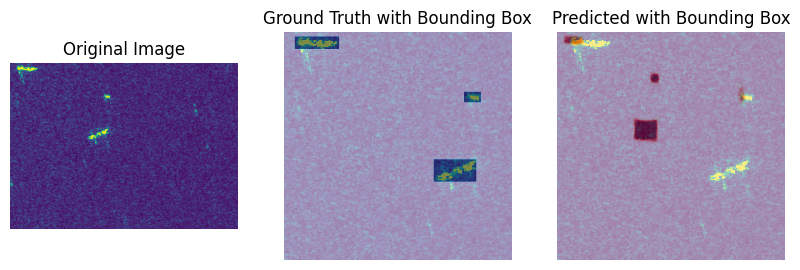

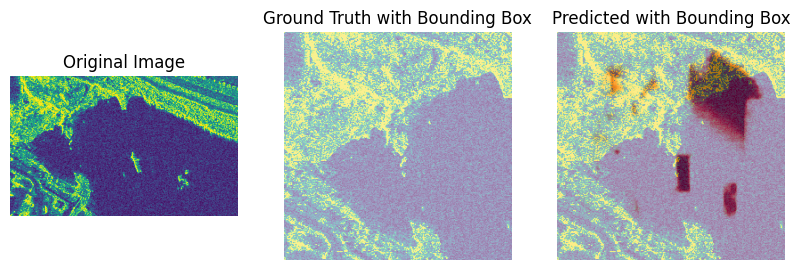

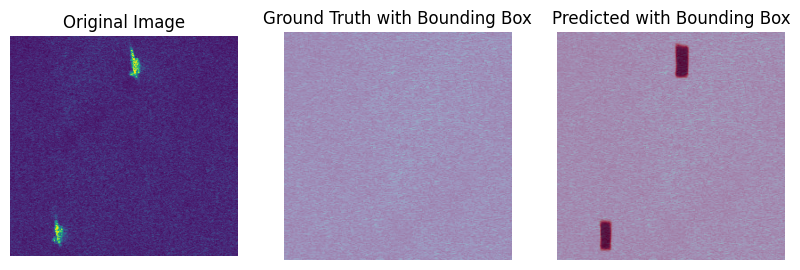

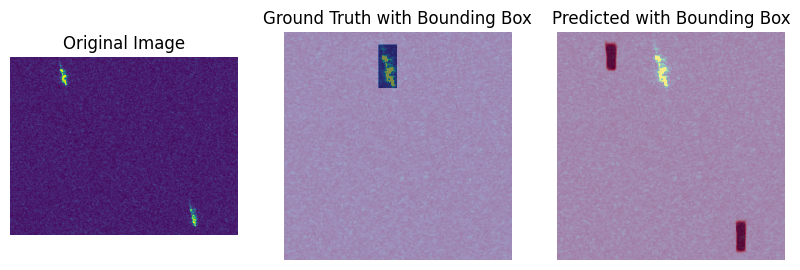

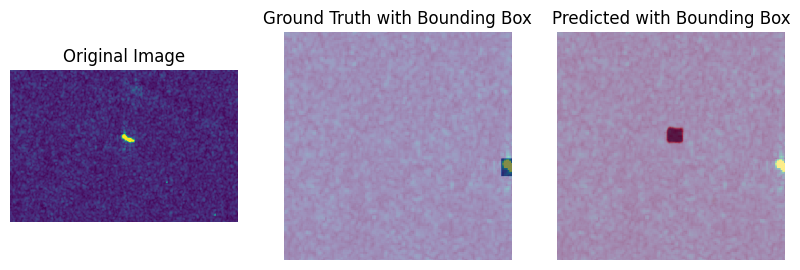

In [28]:
import matplotlib.pyplot as plt

def visualize_bounding_boxes(images, masks, predictions):
    num_images = len(images)

    for i in range(num_images):
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        mask = create_segmentation_masks(mask, (256, 256))
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap='Blues')
        plt.title("Ground Truth with Bounding Box")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap='Reds')
        plt.title("Predicted with Bounding Box")
        plt.axis('off')

        plt.show()

y_pred = model.predict(test_gen)
visualize_bounding_boxes(test_images[:5], test_masks[:5], y_pred[:5])

UNet++

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 1160 images.
Found 1160 mask files.
Epoch 1/75
87/87 [==============================] - 74s 649ms/step - loss: 0.1815 - accuracy: 0.9734 - val_loss: 0.0770 - val_accuracy: 0.9770
Epoch 2/75
87/87 [==============================] - 56s 642ms/step - loss: 0.0714 - accuracy: 0.9775 - val_loss: 0.0623 - val_accuracy: 0.9770
Epoch 3/75
87/87 [==============================] - 56s 647ms/step - loss: 0.0620 - accuracy: 0.9775 - val_loss: 0.0602 - val_accuracy: 0.9770
Epoch 4/75
87/87 [==============================] - 57s 650ms/step - loss: 0.0598 - accuracy: 0.9775 - val_loss: 0.0610 - val_accuracy: 0.9770
Epoch 5/75
87/87 [==============================] - 56s 641ms/step - loss: 0.0576 - accuracy: 0.9775 - val_loss: 0.0558 - val_accuracy: 0.9770
Epoch 6/75
87/87 [==============================] - 56s 644ms/step - loss: 0.0500 - accuracy: 0.9775 - val_loss: 0

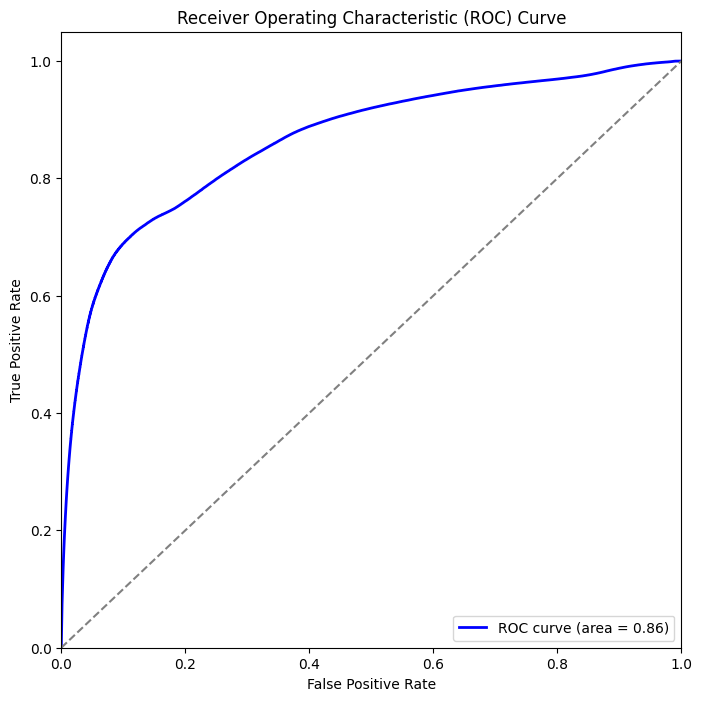

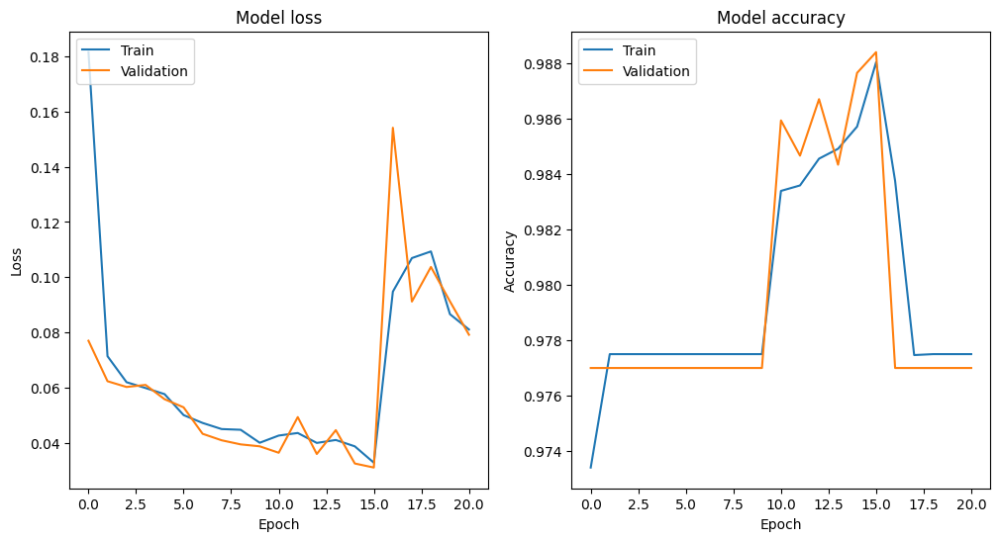

In [7]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.callbacks import EarlyStopping
import xml.etree.ElementTree as ET

from google.colab import drive
drive.mount('/content/drive')

images_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/JPEGImages'
masks_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/Annotations'

if not os.path.exists(images_path):
    raise ValueError(f"Images directory '{images_path}' not found.")

if not os.path.exists(masks_path):
    raise ValueError(f"Masks directory '{masks_path}' not found.")

images = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith('.jpg')])
mask_files = sorted([os.path.join(masks_path, f) for f in os.listdir(masks_path) if f.endswith('.xml')])

if len(mask_files) == 0:
    raise ValueError("No mask files found in the specified directory. Please check your mask directory.")

print(f"Found {len(images)} images.")
print(f"Found {len(mask_files)} mask files.")

train_images, test_images, train_masks, test_masks = train_test_split(images, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(test_images, test_masks, test_size=0.5, random_state=42)

def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return (img, mask)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, images_paths, masks_paths, batch_size=8, image_size=(256, 256)):
        self.images_paths = images_paths
        self.masks_paths = masks_paths
        self.batch_size = batch_size
        self.image_size = image_size

    def __len__(self):
        return len(self.images_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.images_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.masks_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        x = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)
        y = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_x, batch_y)):
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            mask = np.zeros_like(img, dtype=np.uint8)

            tree = ET.parse(mask_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                cv2.rectangle(mask, (xmin, ymin), (xmax, ymax), (255), thickness=-1)

            img = cv2.resize(img, self.image_size)
            mask = cv2.resize(mask, self.image_size)

            img = np.expand_dims(img, axis=-1)
            mask = np.expand_dims(mask, axis=-1)

            x[i], y[i] = adjust_data(img, mask)

        return x, y

def unetplusplus_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = tf.keras.layers.Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = tf.keras.layers.Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation='relu', padding='same')(Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(drop5))
    merge6 = concatenate([drop4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2D(256, 2, activation='relu', padding='same')(Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6))
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2D(128, 2, activation='relu', padding='same')(Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7))
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2D(64, 2, activation='relu', padding='same')(Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8))
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = Conv2D(2, 3, activation='relu', padding='same')(conv9)
    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=conv10)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model = unetplusplus_model(input_size=(256, 256, 1))

batch_size = 8
train_gen = DataGenerator(train_images, train_masks, batch_size=batch_size)
val_gen = DataGenerator(val_images, val_masks, batch_size=batch_size)

history = model.fit(train_gen,
                    epochs=75,
                    validation_data=val_gen,
                    callbacks=[early_stopping])

test_gen = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_pred = model.predict(test_gen)

y_true_flat = np.concatenate([test_gen[i][1].flatten() for i in range(len(test_gen))])
y_pred_flat = y_pred.flatten()

fpr, tpr, thresholds = roc_curve(y_true_flat, y_pred_flat)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [8]:
from sklearn.metrics import f1_score, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score
import math

def compute_iou_masks(y_true, y_pred):
    intersection_area = 0
    union_area = 0

    for mask_true, mask_pred in zip(y_true, y_pred):
        intersection = np.logical_and(mask_true, mask_pred)
        union = np.logical_or(mask_true, mask_pred)

        intersection_area += np.sum(intersection)
        union_area += np.sum(union)

    if union_area == 0:
        return 0

    return intersection_area / union_area

def compute_map_boxes(y_true, y_pred):
    avg_precision = 0

    for i in range(len(y_true)):
        y_true_flat = y_true[i].flatten()
        y_pred_flat = y_pred[i].flatten()

        precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

        avg_precision += average_precision_score(y_true_flat, y_pred_flat)

    return avg_precision / len(y_true)


def compute_psnr_boxes(y_true, y_pred):
    mse_total = 0
    num_samples = len(y_true)

    for box_true, box_pred in zip(y_true, y_pred):
        mse = np.mean((box_true - box_pred) ** 2)
        mse_total += mse

    mse_avg = mse_total / num_samples

    if mse_avg == 0:
        return float('inf')
    else:
        max_pixel = 1.0
        return 20 * math.log10(max_pixel / math.sqrt(mse_avg))


def compute_dice_boxes(y_true, y_pred):
    dice_scores = []

    for box_true, box_pred in zip(y_true, y_pred):
        intersection = np.sum(box_true * box_pred)
        dice = (2. * intersection) / (np.sum(box_true) + np.sum(box_pred))
        dice_scores.append(dice)

    return np.mean(dice_scores)

y_pred = model.predict(test_gen)

test_gen_no_shuffle = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_true = []
for i in range(len(test_gen_no_shuffle)):
    _, batch_y = test_gen_no_shuffle[i]
    y_true.extend(batch_y)

y_true = np.array(y_true)

if y_pred.shape != y_true.shape:
    raise ValueError("Shapes of y_pred and y_true are not compatible.")


iou_boxes = compute_iou_masks(y_true, y_pred)
mAP_boxes = compute_map_boxes(y_true, y_pred)
psnr_boxes = compute_psnr_boxes(y_true, y_pred)
dice_boxes = compute_dice_boxes(y_true, y_pred)

print("Intersection over Union (IoU) for Segmentation Boxes:", iou_boxes)
print("Mean Average Precision (mAP) for Segmentation Boxes:", mAP_boxes)
print("Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes:", psnr_boxes)
print("Dice Coefficient for Segmentation Boxes:", dice_boxes)

29/29 [==============================] - 4s 150ms/step
Intersection over Union (IoU) for Segmentation Boxes: 0.02524810001767915
Mean Average Precision (mAP) for Segmentation Boxes: 0.687238975381485
Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes: 16.83654861490172
Dice Coefficient for Segmentation Boxes: 0.15403446169751883


29/29 [==============================] - 4s 151ms/step


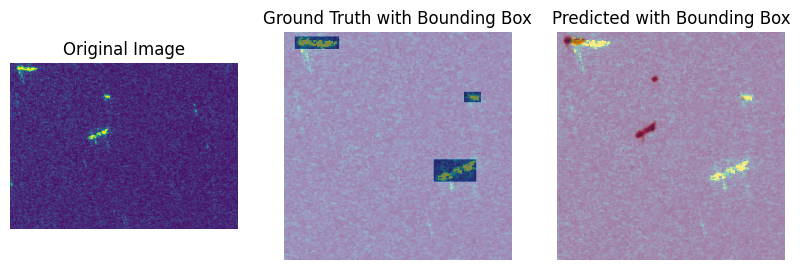

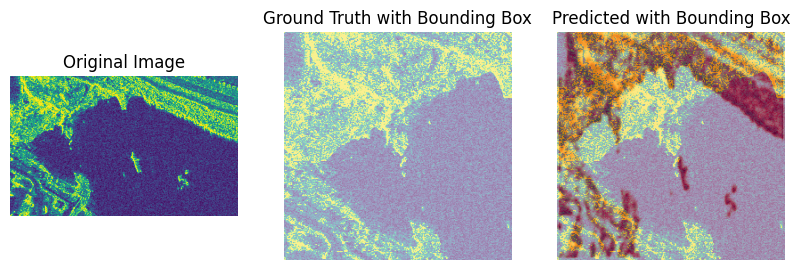

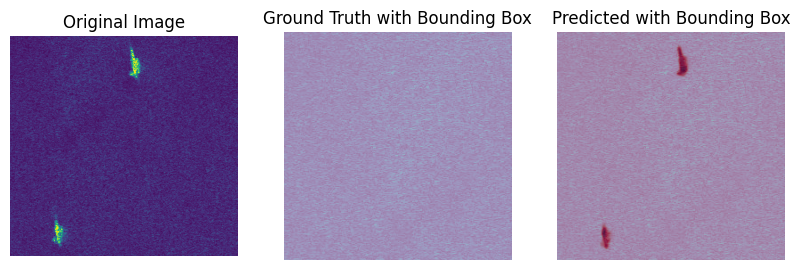

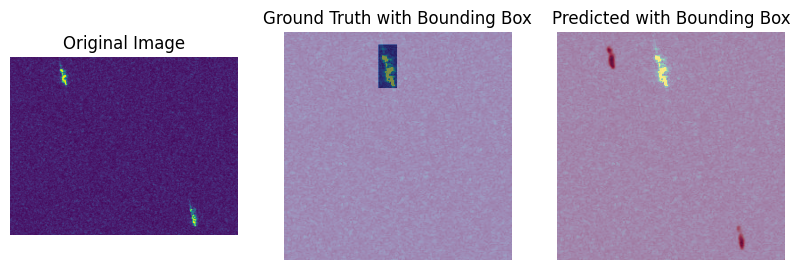

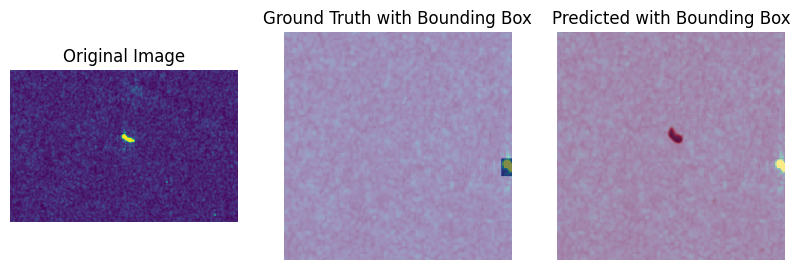

In [9]:
import matplotlib.pyplot as plt

def create_segmentation_masks(xml_path, image_size):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    mask = np.zeros(image_size, dtype=np.uint8)

    for obj in root.findall('object'):
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        mask[ymin:ymax, xmin:xmax] = 1

    return mask

def visualize_bounding_boxes(images, masks, predictions):
    num_images = len(images)

    for i in range(num_images):
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        mask = create_segmentation_masks(mask, (256, 256))
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap='Blues')
        plt.title("Ground Truth with Bounding Box")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap='Reds')
        plt.title("Predicted with Bounding Box")
        plt.axis('off')

        plt.show()

y_pred = model.predict(test_gen)
visualize_bounding_boxes(test_images[:5], test_masks[:5], y_pred[:5])

HRNet

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1160 1160
Found 1160 images.
Found 1160 mask files.
Epoch 1/75
87/87 [==============================] - 45s 391ms/step - loss: 0.1250 - accuracy: 0.9772 - val_loss: 0.0746 - val_accuracy: 0.9770
Epoch 2/75
87/87 [==============================] - 31s 355ms/step - loss: 0.0801 - accuracy: 0.9769 - val_loss: 0.0759 - val_accuracy: 0.9770
Epoch 3/75
87/87 [==============================] - 31s 353ms/step - loss: 0.0746 - accuracy: 0.9775 - val_loss: 0.0850 - val_accuracy: 0.9770
Epoch 4/75
87/87 [==============================] - 31s 357ms/step - loss: 0.0641 - accuracy: 0.9786 - val_loss: 0.0497 - val_accuracy: 0.9838
Epoch 5/75
87/87 [==============================] - 31s 357ms/step - loss: 0.0472 - accuracy: 0.9827 - val_loss: 0.0404 - val_accuracy: 0.9855
Epoch 6/75
87/87 [==============================] - 31s 358ms/step - loss: 0.0443 - accuracy: 0.9840 - v

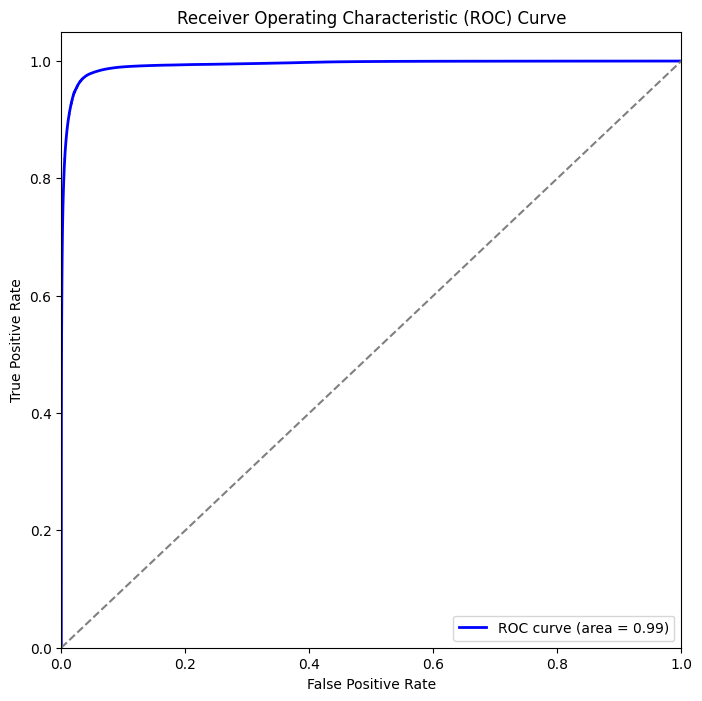

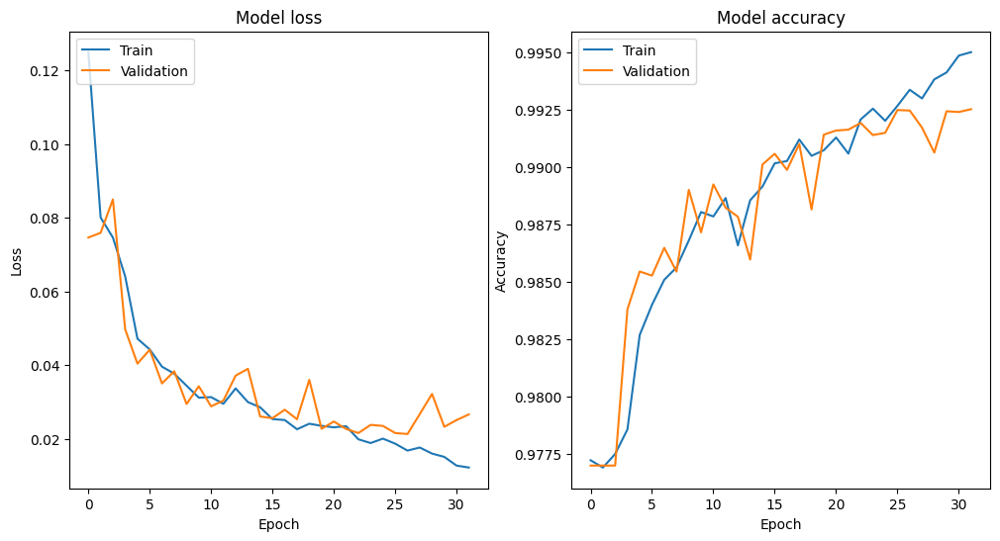

In [22]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, f1_score, roc_curve, auc
from tensorflow.keras.callbacks import EarlyStopping
import xml.etree.ElementTree as ET

from google.colab import drive
drive.mount('/content/drive')

images_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/JPEGImages'
masks_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/Annotations'

if not os.path.exists(images_path):
    raise ValueError(f"Images directory '{images_path}' not found.")

if not os.path.exists(masks_path):
    raise ValueError(f"Masks directory '{masks_path}' not found.")

images = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith('.jpg')])
mask_files = sorted([os.path.join(masks_path, f) for f in os.listdir(masks_path) if f.endswith('.xml')])

print(len(images), len(mask_files))

if len(mask_files) == 0:
    raise ValueError("No mask files found in the specified directory. Please check your mask directory.")

print(f"Found {len(images)} images.")
print(f"Found {len(mask_files)} mask files.")

train_images, test_images, train_masks, test_masks = train_test_split(images, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(test_images, test_masks, test_size=0.5, random_state=42)

def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return (img, mask)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, images_paths, masks_paths, batch_size=8, image_size=(256, 256)):
        self.images_paths = images_paths
        self.masks_paths = masks_paths
        self.batch_size = batch_size
        self.image_size = image_size

    def __len__(self):
        return len(self.images_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.images_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.masks_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        x = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)
        y = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_x, batch_y)):
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            mask = np.zeros_like(img, dtype=np.uint8)

            tree = ET.parse(mask_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                cv2.rectangle(mask, (xmin, ymin), (xmax, ymax), (255), thickness=-1)

            img = cv2.resize(img, self.image_size)
            mask = cv2.resize(mask, self.image_size)

            img = np.expand_dims(img, axis=-1)
            mask = np.expand_dims(mask, axis=-1)

            x[i], y[i] = adjust_data(img, mask)

        return x, y

def hrnet_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv2 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    maxpool1 = MaxPooling2D()(conv2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same')(maxpool1)
    conv4 = Conv2D(128, 3, activation='relu', padding='same')(conv3)
    maxpool2 = MaxPooling2D()(conv4)
    conv5 = Conv2D(256, 3, activation='relu', padding='same')(maxpool2)
    conv6 = Conv2D(256, 3, activation='relu', padding='same')(conv5)
    maxpool3 = MaxPooling2D()(conv6)
    conv7 = Conv2D(512, 3, activation='relu', padding='same')(maxpool3)
    conv8 = Conv2D(512, 3, activation='relu', padding='same')(conv7)
    upsample1 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv8)
    concat1 = concatenate([upsample1, conv6], axis=3)
    conv9 = Conv2D(256, 3, activation='relu', padding='same')(concat1)
    conv10 = Conv2D(256, 3, activation='relu', padding='same')(conv9)
    upsample2 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv10)
    concat2 = concatenate([upsample2, conv4], axis=3)
    conv11 = Conv2D(128, 3, activation='relu', padding='same')(concat2)
    conv12 = Conv2D(128, 3, activation='relu', padding='same')(conv11)
    upsample3 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv12)
    concat3 = concatenate([upsample3, conv2], axis=3)
    conv13 = Conv2D(64, 3, activation='relu', padding='same')(concat3)
    conv14 = Conv2D(64, 3, activation='relu', padding='same')(conv13)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv14)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model = hrnet_model(input_size=(256, 256, 1))

batch_size = 8
train_gen = DataGenerator(train_images, train_masks, batch_size=batch_size)
val_gen = DataGenerator(val_images, val_masks, batch_size=batch_size)

history = model.fit(train_gen,
                    epochs=75,
                    validation_data=val_gen,
                    callbacks=[early_stopping])

test_gen = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_pred = model.predict(test_gen)

y_true_flat = np.concatenate([test_gen[i][1].flatten() for i in range(len(test_gen))])
y_pred_flat = y_pred.flatten()

y_pred_binary = (y_pred_flat > 0.5).astype(int)

fpr, tpr, thresholds = roc_curve(y_true_flat, y_pred_flat)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [23]:
from sklearn.metrics import f1_score, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score
import math

def compute_iou_masks(y_true, y_pred):
    intersection_area = 0
    union_area = 0

    for mask_true, mask_pred in zip(y_true, y_pred):
        intersection = np.logical_and(mask_true, mask_pred)
        union = np.logical_or(mask_true, mask_pred)

        intersection_area += np.sum(intersection)
        union_area += np.sum(union)

    if union_area == 0:
        return 0

    return intersection_area / union_area

def compute_map_boxes(y_true, y_pred):
    avg_precision = 0

    for i in range(len(y_true)):
        y_true_flat = y_true[i].flatten()
        y_pred_flat = y_pred[i].flatten()

        precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

        avg_precision += average_precision_score(y_true_flat, y_pred_flat)

    return avg_precision / len(y_true)


def compute_psnr_boxes(y_true, y_pred):
    mse_total = 0
    num_samples = len(y_true)

    for box_true, box_pred in zip(y_true, y_pred):
        mse = np.mean((box_true - box_pred) ** 2)
        mse_total += mse

    mse_avg = mse_total / num_samples

    if mse_avg == 0:
        return float('inf')
    else:
        max_pixel = 1.0
        return 20 * math.log10(max_pixel / math.sqrt(mse_avg))


def compute_dice_boxes(y_true, y_pred):
    dice_scores = []

    for box_true, box_pred in zip(y_true, y_pred):
        intersection = np.sum(box_true * box_pred)
        dice = (2. * intersection) / (np.sum(box_true) + np.sum(box_pred))
        dice_scores.append(dice)

    return np.mean(dice_scores)

y_pred = model.predict(test_gen)

test_gen_no_shuffle = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_true = []
for i in range(len(test_gen_no_shuffle)):
    _, batch_y = test_gen_no_shuffle[i]
    y_true.extend(batch_y)

y_true = np.array(y_true)

if y_pred.shape != y_true.shape:
    raise ValueError("Shapes of y_pred and y_true are not compatible.")


iou_boxes = compute_iou_masks(y_true, y_pred)
mAP_boxes = compute_map_boxes(y_true, y_pred)
psnr_boxes = compute_psnr_boxes(y_true, y_pred)
dice_boxes = compute_dice_boxes(y_true, y_pred)

print("Intersection over Union (IoU) for Segmentation Boxes:", iou_boxes)
print("Mean Average Precision (mAP) for Segmentation Boxes:", mAP_boxes)
print("Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes:", psnr_boxes)
print("Dice Coefficient for Segmentation Boxes:", dice_boxes)

29/29 [==============================] - 3s 114ms/step
Intersection over Union (IoU) for Segmentation Boxes: 0.02524810001767915
Mean Average Precision (mAP) for Segmentation Boxes: 0.9402218880026685
Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes: 21.50030297661877
Dice Coefficient for Segmentation Boxes: 0.7823253993343883


29/29 [==============================] - 4s 123ms/step


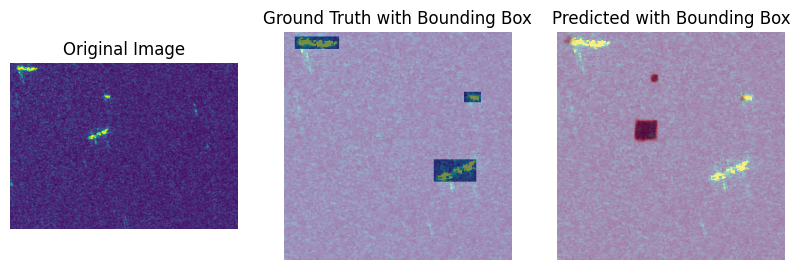

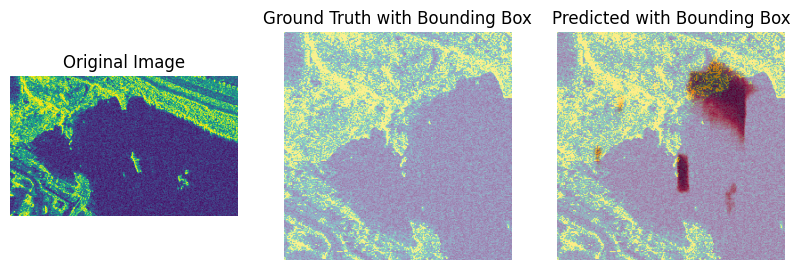

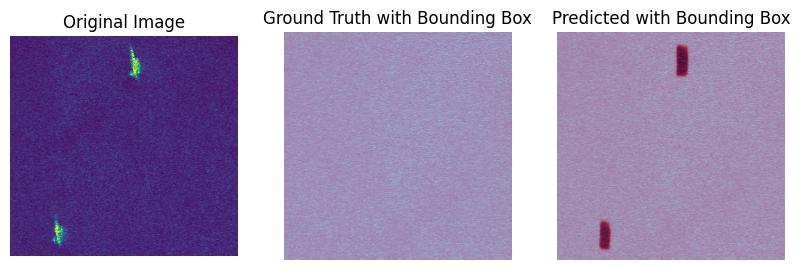

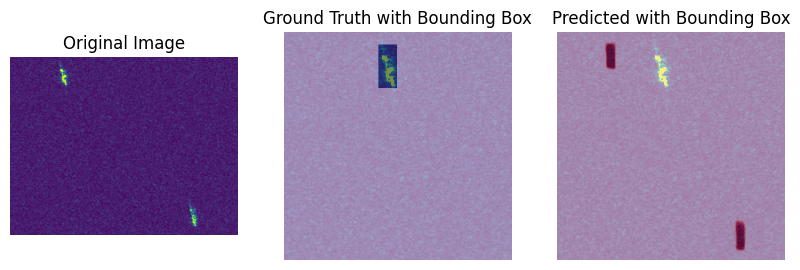

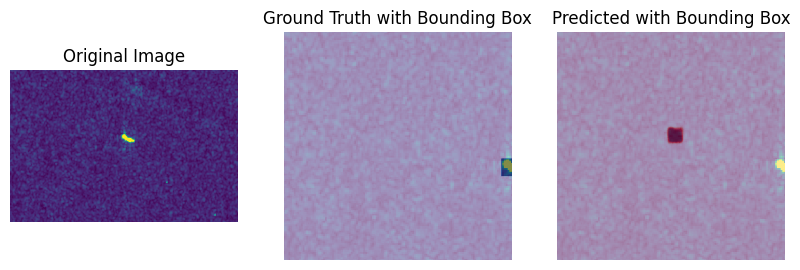

In [24]:
import matplotlib.pyplot as plt

def visualize_bounding_boxes(images, masks, predictions):
    num_images = len(images)

    for i in range(num_images):
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        mask = create_segmentation_masks(mask, (256, 256))
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap='Blues')
        plt.title("Ground Truth with Bounding Box")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap='Reds')
        plt.title("Predicted with Bounding Box")
        plt.axis('off')

        plt.show()

y_pred = model.predict(test_gen)
visualize_bounding_boxes(test_images[:5], test_masks[:5], y_pred[:5])

UNet3+

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 1160 images.
Found 1160 mask files.
Epoch 1/75
87/87 [==============================] - 43s 419ms/step - loss: 0.2078 - accuracy: 0.9761 - val_loss: 0.0853 - val_accuracy: 0.9776
Epoch 2/75
87/87 [==============================] - 33s 383ms/step - loss: 0.0709 - accuracy: 0.9774 - val_loss: 0.0618 - val_accuracy: 0.9770
Epoch 3/75
87/87 [==============================] - 33s 379ms/step - loss: 0.0653 - accuracy: 0.9775 - val_loss: 0.0636 - val_accuracy: 0.9770
Epoch 4/75
87/87 [==============================] - 31s 356ms/step - loss: 0.0727 - accuracy: 0.9771 - val_loss: 0.0595 - val_accuracy: 0.9800
Epoch 5/75
87/87 [==============================] - 33s 379ms/step - loss: 0.0526 - accuracy: 0.9821 - val_loss: 0.0449 - val_accuracy: 0.9837
Epoch 6/75
87/87 [==============================] - 31s 356ms/step - loss: 0.0433 - accuracy: 0.9845 - val_loss: 0

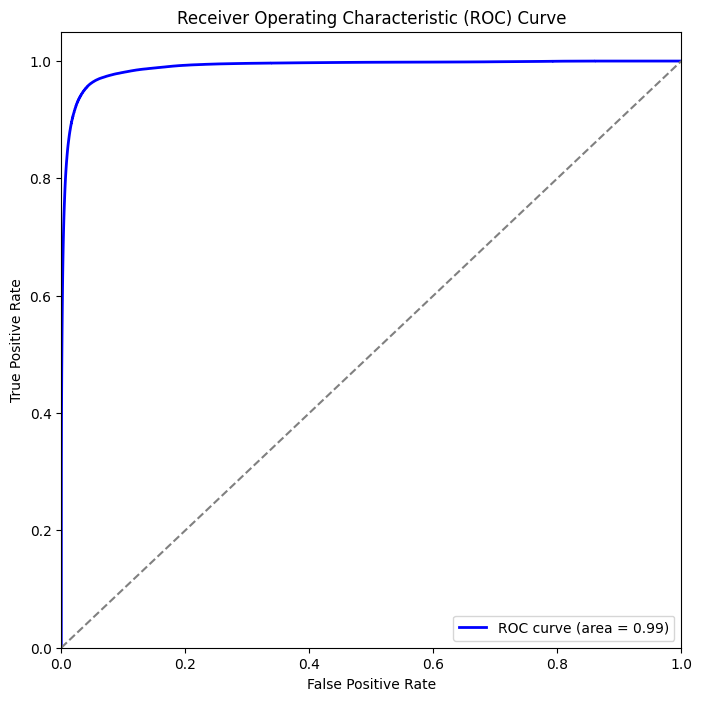

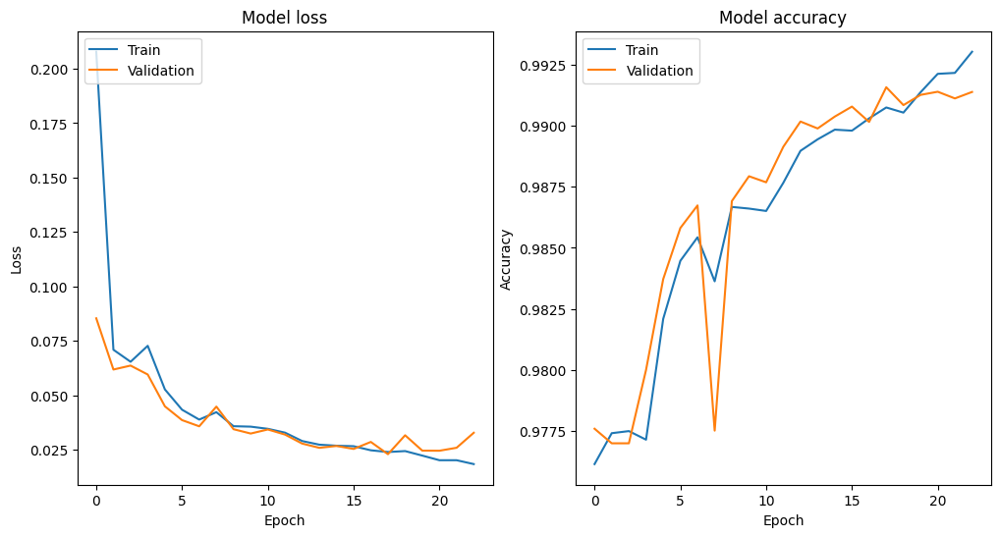

In [10]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, f1_score, roc_curve, auc
from skimage.metrics import peak_signal_noise_ratio
from tensorflow.keras.callbacks import EarlyStopping
import xml.etree.ElementTree as ET

from google.colab import drive
drive.mount('/content/drive')

images_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/JPEGImages'
masks_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/Annotations'

if not os.path.exists(images_path):
    raise ValueError(f"Images directory '{images_path}' not found.")

if not os.path.exists(masks_path):
    raise ValueError(f"Masks directory '{masks_path}' not found.")

images = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith('.jpg')])
mask_files = sorted([os.path.join(masks_path, f) for f in os.listdir(masks_path) if f.endswith('.xml')])

if len(mask_files) == 0:
    raise ValueError("No mask files found in the specified directory. Please check your mask directory.")

print(f"Found {len(images)} images.")
print(f"Found {len(mask_files)} mask files.")

train_images, test_images, train_masks, test_masks = train_test_split(images, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(test_images, test_masks, test_size=0.5, random_state=42)

def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return (img, mask)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, images_paths, masks_paths, batch_size=8, image_size=(256, 256)):
        self.images_paths = images_paths
        self.masks_paths = masks_paths
        self.batch_size = batch_size
        self.image_size = image_size

    def __len__(self):
        return len(self.images_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.images_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.masks_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        x = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)
        y = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_x, batch_y)):
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            mask = np.zeros_like(img, dtype=np.uint8)

            tree = ET.parse(os.path.join(masks_path, mask_path))
            root = tree.getroot()
            for obj in root.findall('object'):
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                cv2.rectangle(mask, (xmin, ymin), (xmax, ymax), (255), thickness=-1)

            img = cv2.resize(img, self.image_size)
            mask = cv2.resize(mask, self.image_size)

            img = np.expand_dims(img, axis=-1)
            mask = np.expand_dims(mask, axis=-1)

            x[i], y[i] = adjust_data(img, mask)

        return x, y

def unet3plus_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    conv1_1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1_2 = Conv2D(64, 3, activation='relu', padding='same')(conv1_1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1_2)

    conv2_1 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2_2 = Conv2D(128, 3, activation='relu', padding='same')(conv2_1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2_2)

    conv3_1 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3_2 = Conv2D(256, 3, activation='relu', padding='same')(conv3_1)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3_2)

    conv4_1 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4_2 = Conv2D(512, 3, activation='relu', padding='same')(conv4_1)

    upconv3_1 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv4_2)
    merge3 = concatenate([upconv3_1, conv3_2], axis=3)
    conv3_3 = Conv2D(256, 3, activation='relu', padding='same')(merge3)
    conv3_4 = Conv2D(256, 3, activation='relu', padding='same')(conv3_3)

    upconv2_1 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv3_4)
    merge2 = concatenate([upconv2_1, conv2_2], axis=3)
    conv2_3 = Conv2D(128, 3, activation='relu', padding='same')(merge2)
    conv2_4 = Conv2D(128, 3, activation='relu', padding='same')(conv2_3)

    upconv1_1 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv2_4)
    merge1 = concatenate([upconv1_1, conv1_2], axis=3)
    conv1_3 = Conv2D(64, 3, activation='relu', padding='same')(merge1)
    conv1_4 = Conv2D(64, 3, activation='relu', padding='same')(conv1_3)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv1_4)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model = unet3plus_model(input_size=(256, 256, 1))

batch_size = 8
train_gen = DataGenerator(train_images, train_masks, batch_size=batch_size)
val_gen = DataGenerator(val_images, val_masks, batch_size=batch_size)

history = model.fit(train_gen,
                    epochs=75,
                    validation_data=val_gen,
                    callbacks=[early_stopping])

test_gen = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_pred = model.predict(test_gen)

y_true_flat = np.concatenate([test_gen[i][1].flatten() for i in range(len(test_gen))])
y_pred_flat = y_pred.flatten()

y_pred_binary = (y_pred_flat > 0.5).astype(int)

fpr, tpr, thresholds = roc_curve(y_true_flat, y_pred_flat)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [11]:
from sklearn.metrics import f1_score, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score
import math

def compute_iou_masks(y_true, y_pred):
    intersection_area = 0
    union_area = 0

    for mask_true, mask_pred in zip(y_true, y_pred):
        intersection = np.logical_and(mask_true, mask_pred)
        union = np.logical_or(mask_true, mask_pred)

        intersection_area += np.sum(intersection)
        union_area += np.sum(union)

    if union_area == 0:
        return 0

    return intersection_area / union_area

def compute_map_boxes(y_true, y_pred):
    avg_precision = 0

    for i in range(len(y_true)):
        y_true_flat = y_true[i].flatten()
        y_pred_flat = y_pred[i].flatten()

        precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

        avg_precision += average_precision_score(y_true_flat, y_pred_flat)

    return avg_precision / len(y_true)


def compute_psnr_boxes(y_true, y_pred):
    mse_total = 0
    num_samples = len(y_true)

    for box_true, box_pred in zip(y_true, y_pred):
        mse = np.mean((box_true - box_pred) ** 2)
        mse_total += mse

    mse_avg = mse_total / num_samples

    if mse_avg == 0:
        return float('inf')
    else:
        max_pixel = 1.0
        return 20 * math.log10(max_pixel / math.sqrt(mse_avg))


def compute_dice_boxes(y_true, y_pred):
    dice_scores = []

    for box_true, box_pred in zip(y_true, y_pred):
        intersection = np.sum(box_true * box_pred)
        dice = (2. * intersection) / (np.sum(box_true) + np.sum(box_pred))
        dice_scores.append(dice)

    return np.mean(dice_scores)

y_pred = model.predict(test_gen)

test_gen_no_shuffle = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_true = []
for i in range(len(test_gen_no_shuffle)):
    _, batch_y = test_gen_no_shuffle[i]
    y_true.extend(batch_y)

y_true = np.array(y_true)

if y_pred.shape != y_true.shape:
    raise ValueError("Shapes of y_pred and y_true are not compatible.")


iou_boxes = compute_iou_masks(y_true, y_pred)
mAP_boxes = compute_map_boxes(y_true, y_pred)
psnr_boxes = compute_psnr_boxes(y_true, y_pred)
dice_boxes = compute_dice_boxes(y_true, y_pred)

print("Intersection over Union (IoU) for Segmentation Boxes:", iou_boxes)
print("Mean Average Precision (mAP) for Segmentation Boxes:", mAP_boxes)
print("Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes:", psnr_boxes)
print("Dice Coefficient for Segmentation Boxes:", dice_boxes)

29/29 [==============================] - 3s 113ms/step
Intersection over Union (IoU) for Segmentation Boxes: 0.02524810001767915
Mean Average Precision (mAP) for Segmentation Boxes: 0.9232297755999418
Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes: 20.59145252840807
Dice Coefficient for Segmentation Boxes: 0.7711032429591808


29/29 [==============================] - 3s 107ms/step


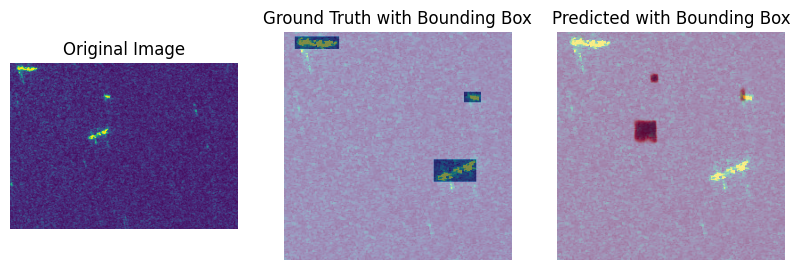

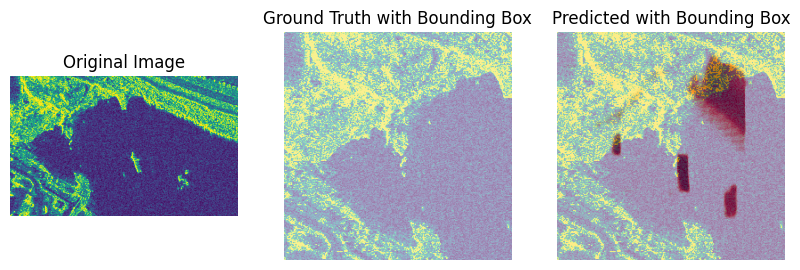

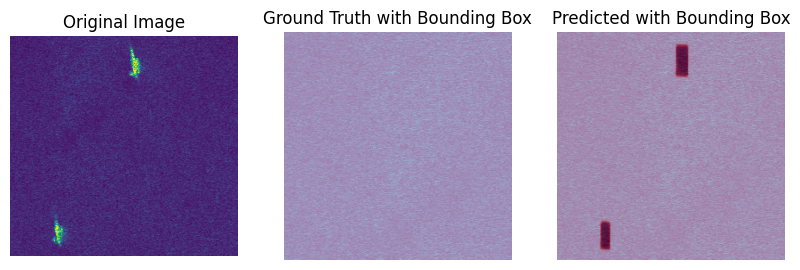

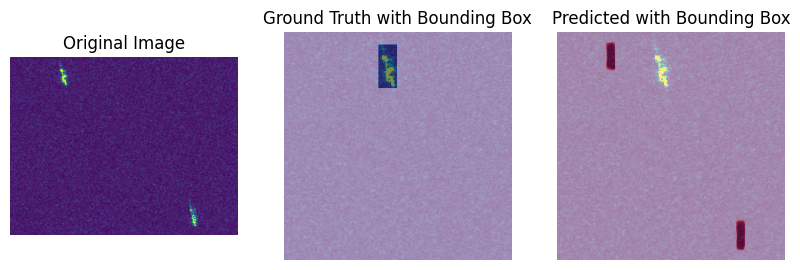

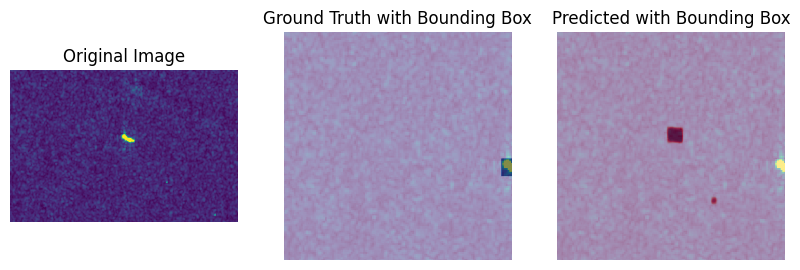

In [14]:
import matplotlib.pyplot as plt

def visualize_bounding_boxes(images, masks, predictions):
    num_images = len(images)

    for i in range(num_images):
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        mask = create_segmentation_masks(mask, (256, 256))
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap='Blues')
        plt.title("Ground Truth with Bounding Box")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap='Reds')
        plt.title("Predicted with Bounding Box")
        plt.axis('off')

        plt.show()

y_pred = model.predict(test_gen)
visualize_bounding_boxes(test_images[:5], test_masks[:5], y_pred[:5])

SegNet Model

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 1160 images.
Found 1160 mask files.
Epoch 1/75
87/87 [==============================] - 46s 384ms/step - loss: 0.1642 - accuracy: 0.9749 - val_loss: 0.1124 - val_accuracy: 0.9770
Epoch 2/75
87/87 [==============================] - 32s 366ms/step - loss: 0.1137 - accuracy: 0.9775 - val_loss: 0.1123 - val_accuracy: 0.9770
Epoch 3/75
87/87 [==============================] - 32s 366ms/step - loss: 0.1108 - accuracy: 0.9775 - val_loss: 0.1148 - val_accuracy: 0.9770
Epoch 4/75
87/87 [==============================] - 32s 372ms/step - loss: 0.1096 - accuracy: 0.9775 - val_loss: 0.1105 - val_accuracy: 0.9770
Epoch 5/75
87/87 [==============================] - 32s 366ms/step - loss: 0.1096 - accuracy: 0.9775 - val_loss: 0.1097 - val_accuracy: 0.9770
Epoch 6/75
87/87 [==============================] - 32s 369ms/step - loss: 0.1089 - accuracy: 0.9775 - val_loss: 0

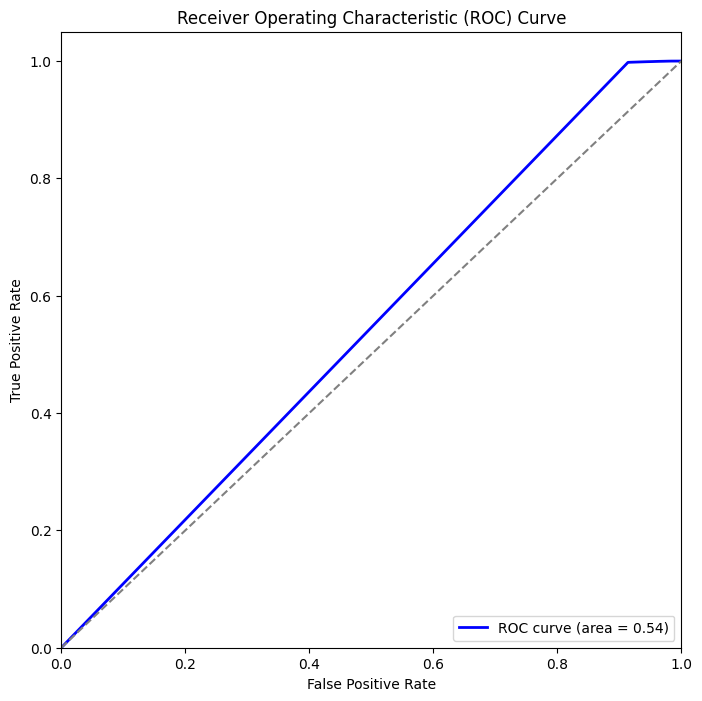

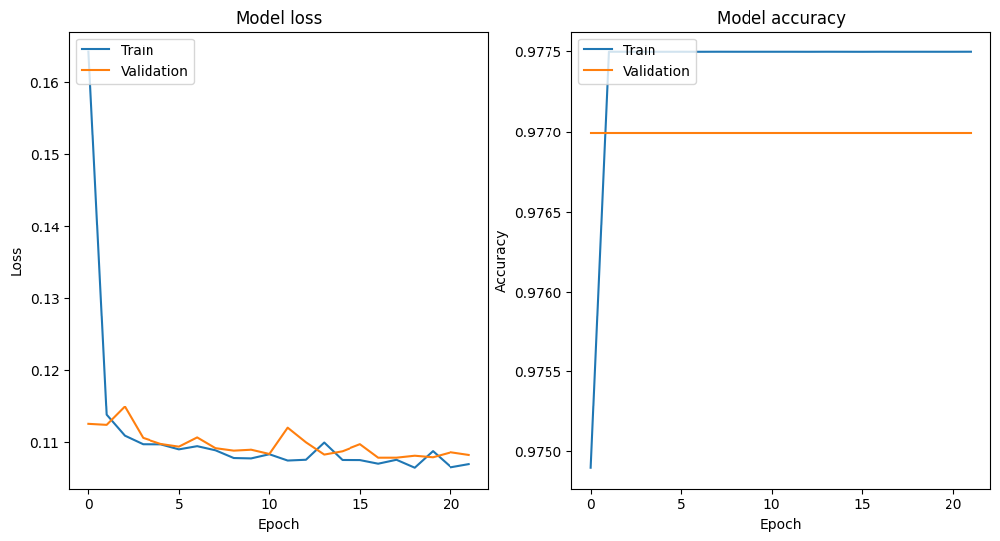

In [15]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

from google.colab import drive
drive.mount('/content/drive')

images_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/JPEGImages'
masks_path = '/content/drive/MyDrive/BBox_SSDD/voc_style/Annotations'

if not os.path.exists(images_path):
    raise ValueError(f"Images directory '{images_path}' not found.")

if not os.path.exists(masks_path):
    raise ValueError(f"Masks directory '{masks_path}' not found.")

images = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith('.jpg')])
mask_files = sorted([os.path.join(masks_path, f) for f in os.listdir(masks_path) if f.endswith('.xml')])

if len(mask_files) == 0:
    raise ValueError("No mask files found in the specified directory. Please check your mask directory.")

print(f"Found {len(images)} images.")
print(f"Found {len(mask_files)} mask files.")

train_images, test_images, train_masks, test_masks = train_test_split(images, mask_files, test_size=0.4, random_state=42)
val_images, test_images, val_masks, test_masks = train_test_split(test_images, test_masks, test_size=0.5, random_state=42)

def adjust_data(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return (img, mask)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, images_paths, masks_paths, batch_size=8, image_size=(256, 256)):
        self.images_paths = images_paths
        self.masks_paths = masks_paths
        self.batch_size = batch_size
        self.image_size = image_size

    def __len__(self):
        return len(self.images_paths) // self.batch_size

    def __getitem__(self, idx):
        batch_x = self.images_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.masks_paths[idx * self.batch_size:(idx + 1) * self.batch_size]

        x = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)
        y = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(zip(batch_x, batch_y)):
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            mask = np.zeros_like(img, dtype=np.uint8)

            tree = ET.parse(mask_path)
            root = tree.getroot()
            for obj in root.findall('object'):
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                cv2.rectangle(mask, (xmin, ymin), (xmax, ymax), (255), thickness=-1)

            img = cv2.resize(img, self.image_size)
            mask = cv2.resize(mask, self.image_size)

            img = np.expand_dims(img, axis=-1)
            mask = np.expand_dims(mask, axis=-1)

            x[i], y[i] = adjust_data(img, mask)

        return x, y

def segnet_model(input_size=(256, 256, 1)):
    inputs = Input(input_size)

    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    up6 = Conv2DTranspose(512, 2, strides=(2, 2), padding='same')(conv5)
    up6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    up6 = Conv2D(512, 3, activation='relu', padding='same')(up6)

    up7 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(up6)
    up7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    up7 = Conv2D(256, 3, activation='relu', padding='same')(up7)

    up8 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(up7)
    up8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    up8 = Conv2D(128, 3, activation='relu', padding='same')(up8)

    up9 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(up8)
    up9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    up9 = Conv2D(64, 3, activation='relu', padding='same')(up9)

    outputs = Conv2D(1, 1, activation='sigmoid')(up9)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model = segnet_model(input_size=(256, 256, 1))

batch_size = 8
train_gen = DataGenerator(train_images, train_masks, batch_size=batch_size)
val_gen = DataGenerator(val_images, val_masks, batch_size=batch_size)

history = model.fit(train_gen,
                    epochs=75,
                    validation_data=val_gen,
                    callbacks=[early_stopping])

test_gen = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_pred = model.predict(test_gen)

y_true_flat = np.concatenate([test_gen[i][1].flatten() for i in range(len(test_gen))])
y_pred_flat = y_pred.flatten()

y_pred_binary = (y_pred_flat > 0.5).astype(int)

fpr, tpr, thresholds = roc_curve(y_true_flat, y_pred_flat)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [16]:
from sklearn.metrics import f1_score, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score
import math

def compute_iou_masks(y_true, y_pred):
    intersection_area = 0
    union_area = 0

    for mask_true, mask_pred in zip(y_true, y_pred):
        intersection = np.logical_and(mask_true, mask_pred)
        union = np.logical_or(mask_true, mask_pred)

        intersection_area += np.sum(intersection)
        union_area += np.sum(union)

    if union_area == 0:
        return 0

    return intersection_area / union_area

def compute_map_boxes(y_true, y_pred):
    avg_precision = 0

    for i in range(len(y_true)):
        y_true_flat = y_true[i].flatten()
        y_pred_flat = y_pred[i].flatten()

        precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

        avg_precision += average_precision_score(y_true_flat, y_pred_flat)

    return avg_precision / len(y_true)


def compute_psnr_boxes(y_true, y_pred):
    mse_total = 0
    num_samples = len(y_true)

    for box_true, box_pred in zip(y_true, y_pred):
        mse = np.mean((box_true - box_pred) ** 2)
        mse_total += mse

    mse_avg = mse_total / num_samples

    if mse_avg == 0:
        return float('inf')
    else:
        max_pixel = 1.0
        return 20 * math.log10(max_pixel / math.sqrt(mse_avg))


def compute_dice_boxes(y_true, y_pred):
    dice_scores = []

    for box_true, box_pred in zip(y_true, y_pred):
        intersection = np.sum(box_true * box_pred)
        dice = (2. * intersection) / (np.sum(box_true) + np.sum(box_pred))
        dice_scores.append(dice)

    return np.mean(dice_scores)

y_pred = model.predict(test_gen)

test_gen_no_shuffle = DataGenerator(test_images, test_masks, batch_size=batch_size)

y_true = []
for i in range(len(test_gen_no_shuffle)):
    _, batch_y = test_gen_no_shuffle[i]
    y_true.extend(batch_y)

y_true = np.array(y_true)

if y_pred.shape != y_true.shape:
    raise ValueError("Shapes of y_pred and y_true are not compatible.")


iou_boxes = compute_iou_masks(y_true, y_pred)
mAP_boxes = compute_map_boxes(y_true, y_pred)
psnr_boxes = compute_psnr_boxes(y_true, y_pred)
dice_boxes = compute_dice_boxes(y_true, y_pred)

print("Intersection over Union (IoU) for Segmentation Boxes:", iou_boxes)
print("Mean Average Precision (mAP) for Segmentation Boxes:", mAP_boxes)
print("Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes:", psnr_boxes)
print("Dice Coefficient for Segmentation Boxes:", dice_boxes)

29/29 [==============================] - 3s 106ms/step
Intersection over Union (IoU) for Segmentation Boxes: 0.02524810001767915
Mean Average Precision (mAP) for Segmentation Boxes: 0.02750559474767357
Peak Signal to Noise Ratio (PSNR) for Segmentation Boxes: 16.097459952797813
Dice Coefficient for Segmentation Boxes: 0.02266374995209535


29/29 [==============================] - 4s 128ms/step


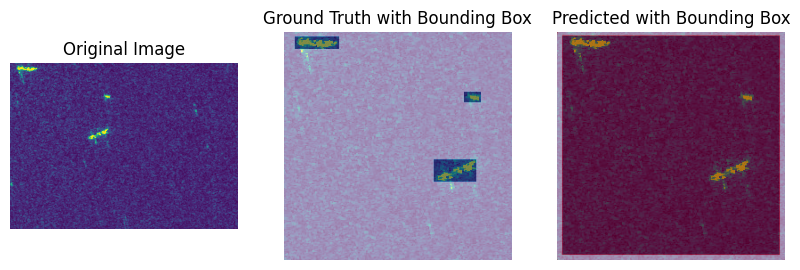

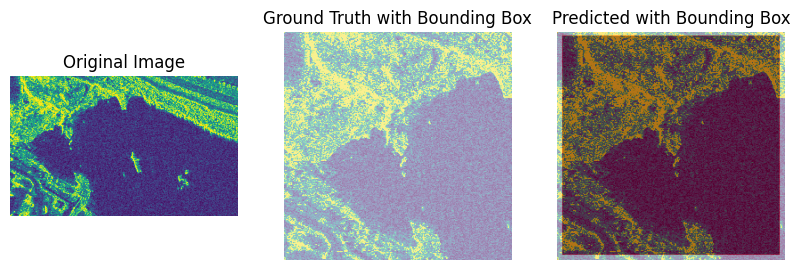

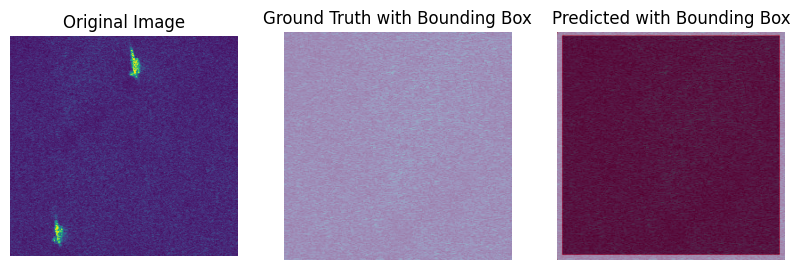

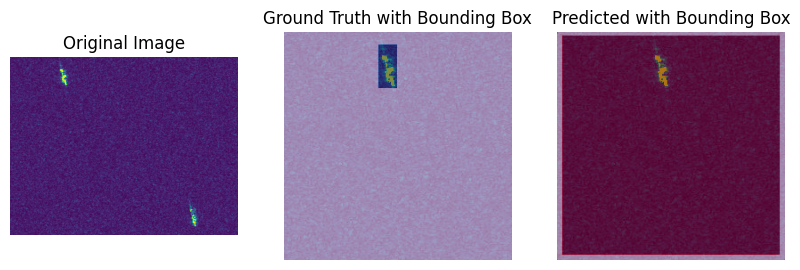

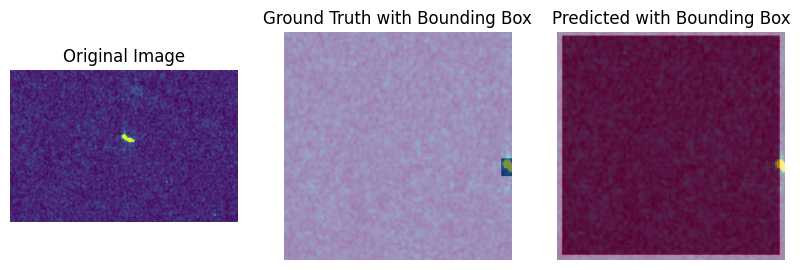

In [18]:
import matplotlib.pyplot as plt

def visualize_bounding_boxes(images, masks, predictions):
    num_images = len(images)

    for i in range(num_images):
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        mask = create_segmentation_masks(mask, (256, 256))
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap='Blues')
        plt.title("Ground Truth with Bounding Box")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap='Reds')
        plt.title("Predicted with Bounding Box")
        plt.axis('off')

        plt.show()

y_pred = model.predict(test_gen)
visualize_bounding_boxes(test_images[:5], test_masks[:5], y_pred[:5])